# Plant Leaf Classification

Autonomus University of San Luis Potosi

Luis Angel Sánchez Muñiz

Faculty Key: 202102300011

UASLP Key: 0337911

Advisser: Juan Carlos Cuevas Tello

In [1]:
import tensorflow as tf
import os
import cv2
import imghdr
from matplotlib import pyplot as plt
import numpy as np
from skimage import color
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

C:\Users\luisa\AppData\Local\Temp\ipykernel_17888\2627631950.py:4: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


In [2]:
data_path = "plant_leaf/Plant_leave_diseases_dataset_without_augmentation"
leaf_class=os.listdir(data_path)

In [3]:
image_ext = ['jpg', 'jpeg', 'bmp', 'png' ]

def image_validation(data_path):
    for image_class in os.listdir(data_path): 
        for image in os.listdir(os.path.join(data_path, image_class)):
            image_path = os.path.join(data_path,image_class, image)
            try: 
                img = cv2.imread(image_path)
                tip = imghdr.what(image_path)
                if tip not in image_ext:
                    print('Image not in ext list{}'.format(image_path))
                    os.remove(image_path)
            except Exception as e:
                print('Issue with image {}'.format(image_path))

In [4]:
# Not needed
#image_validation(data_path)

In [5]:
class_names = ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry___Powdery_mildew', 'Cherry___healthy', 'Corn___Cercospora_leaf_spot Gray_leaf_spot', 'Corn___Common_rust', 'Corn___Northern_Leaf_Blight', 'Corn___healthy', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Strawberry___healthy', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']

In [6]:
data = tf.keras.utils.image_dataset_from_directory(data_path, image_size=(256,256))

Found 54307 files belonging to 38 classes.


In [7]:
num_classes = 38

In [8]:
data_iterator = data.as_numpy_iterator()
batch = data_iterator.next()
batch[0].shape

(32, 256, 256, 3)

In [9]:
batch[0].max()

255.0

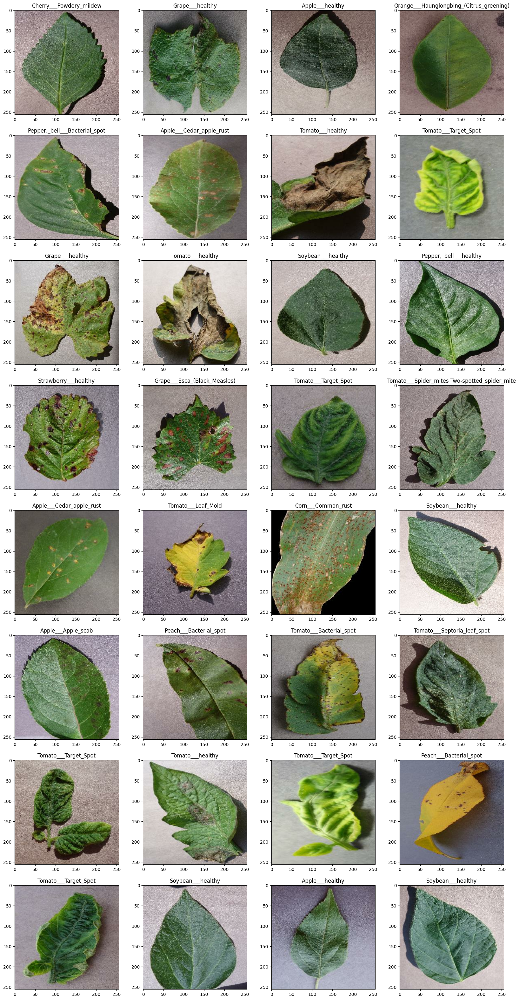

In [10]:
# change only row
fig_dim = [8,4]
height = int(fig_dim[0]*40/8)
fig, ax = plt.subplots(nrows=fig_dim[0], ncols=fig_dim[1], figsize=(20,height))

for idx, img in enumerate(batch[0][:fig_dim[0]*fig_dim[1]]):
    ax[int(idx/fig_dim[1])][idx%fig_dim[1]].imshow(img.astype(int))
    ax[int(idx/fig_dim[1])][idx%fig_dim[1]].title.set_text(leaf_class[batch[1][idx]])

(256, 256, 3)
0.06103515625,  98.9013671875
(256, 256, 3)
0.23193359375,  89.385986328125
(256, 256, 3)
0.177001953125,  95.1416015625
(256, 256, 3)
7.794189453125,  65.960693359375


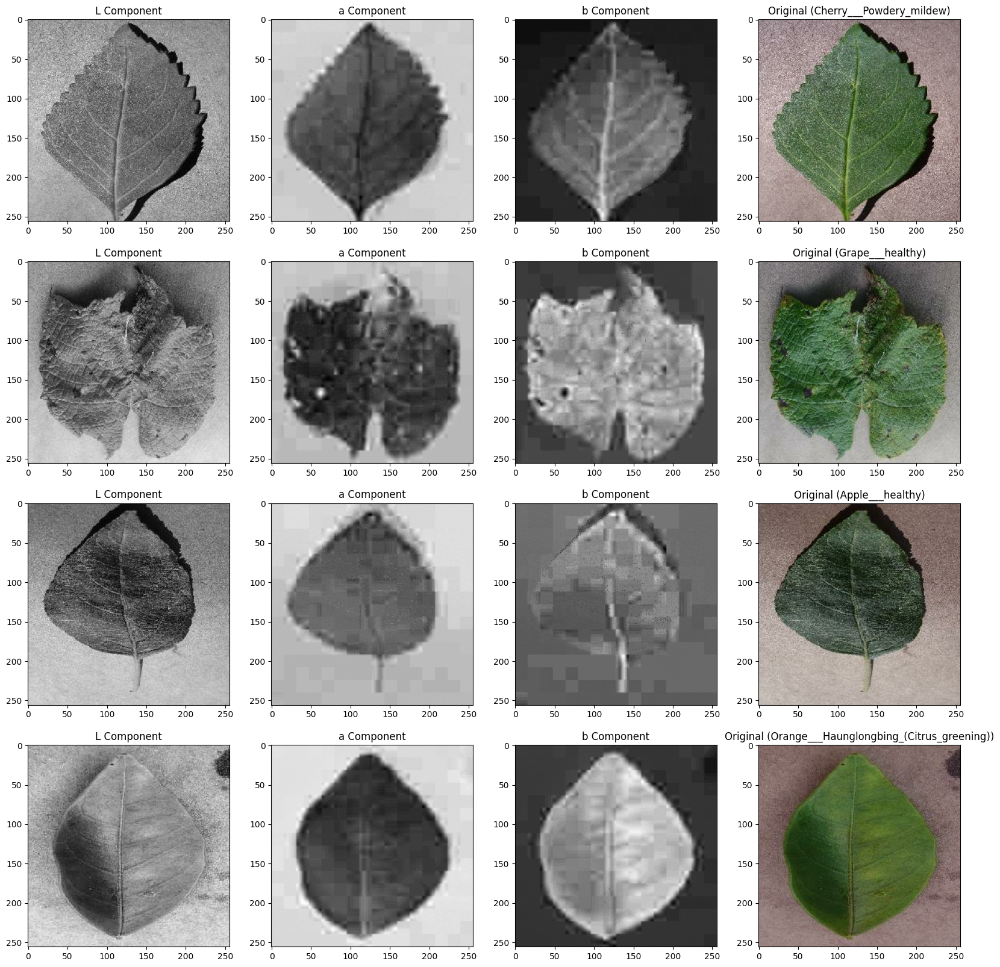

In [11]:
# C-lab scale
fig, ax = plt.subplots(nrows=4, ncols=4, figsize=(20, 20))

for idx, img in enumerate(batch[0][:4]):
    img = img/255
    lab_img = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    #lab_img = color.rgb2lab(img)
    l, a, b = lab_img[:,:,0], lab_img[:,:,1], lab_img[:,:,2]
    print(img.shape)
    print(f'{lab_img[:,:,0].min()},  {lab_img[:,:,0].max()}')

    ax[idx, 0].imshow(l, cmap='gray')
    ax[idx, 0].title.set_text('L Component')
    ax[idx, 1].imshow(a, cmap='gray')
    ax[idx, 1].title.set_text('a Component')
    ax[idx, 2].imshow(b, cmap='gray')
    ax[idx, 2].title.set_text('b Component')
    ax[idx, 3].imshow(img)
    ax[idx, 3].title.set_text(f'Original ({leaf_class[batch[1][idx]]})')

### CIELAB preprocessing

In [12]:
# Function to convert RGB to LAB and normalize
def convert_to_lab(image):
    image = image / 255.0  # Normalize RGB values to [0, 1]
    lab = cv2.cvtColor(image.astype('float32'), cv2.COLOR_RGB2Lab)

    # Normalizing the L, a, b channels
    L_max = 100.0
    a_max = 127.0
    b_max = 127.0

    lab[:, :, 0] = lab[:, :, 0] / L_max  # L channel to [0, 1]
    lab[:, :, 1] = (lab[:, :, 1] + 128) / 255  # a channel to [0, 1]
    lab[:, :, 2] = (lab[:, :, 2] + 128) / 255  # b channel to [0, 1]

    return lab.astype('float32')

def tf_convert_to_lab(x):
    # We need to map the conversion to each image in the batch
    def process_batch(batch):
        return np.array([convert_to_lab(image) for image in batch])

    return tf.numpy_function(process_batch, [x], tf.float32)

data = data.map(lambda x, y: (tf_convert_to_lab(x), y))

# Example of iterating through the dataset
data_iterator = data.as_numpy_iterator()
batch = data_iterator.next()

# Print to verify the normalized LAB values
print(batch[0][0])

[[[0.26293945 0.5193015  0.5137868 ]
  [0.20458984 0.52003676 0.51433825]
  [0.18157959 0.5203431  0.5146446 ]
  ...
  [0.5946655  0.51985294 0.48033088]
  [0.59851074 0.51985294 0.48033088]
  [0.59088135 0.5199142  0.4802696 ]]

 [[0.18621826 0.5203431  0.51458335]
  [0.16290283 0.52077204 0.5148897 ]
  [0.19085693 0.52028185 0.5145221 ]
  ...
  [0.6251221  0.5196691  0.4805147 ]
  [0.6213379  0.5197304  0.48045343]
  [0.60614014 0.51979166 0.48033088]]

 [[0.20910645 0.5199755  0.514277  ]
  [0.18157959 0.5203431  0.5146446 ]
  [0.19537354 0.5202206  0.5144608 ]
  ...
  [0.6326294  0.51960784 0.48057598]
  [0.6175537  0.5197304  0.48045343]
  [0.59088135 0.5199142  0.4802696 ]]

 ...

 [[0.2467041  0.43290442 0.6       ]
  [0.27093506 0.4283088  0.6046569 ]
  [0.2612915  0.42585784 0.60018384]
  ...
  [0.4977417  0.5246936  0.47745097]
  [0.4977417  0.5246936  0.47745097]
  [0.4977417  0.5246936  0.47745097]]

 [[0.25482178 0.4317402  0.5974265 ]
  [0.27539062 0.42892158 0.60085785]


In [13]:
[batch[0].max(), batch[0].min()]

[1.0, 0.0]

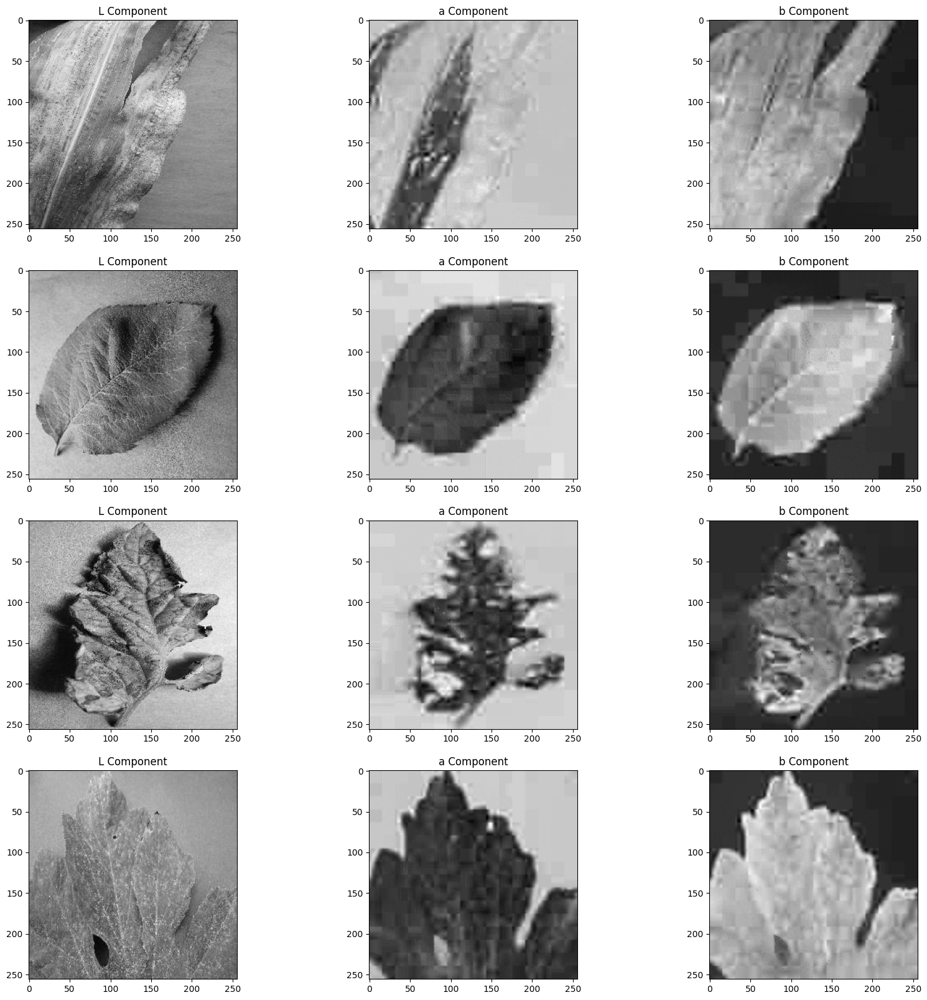

In [14]:
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(20, 20))

for idx, img in enumerate(batch[0][:4]):
    lab_img = img
    l, a, b = lab_img[:,:,0], lab_img[:,:,1], lab_img[:,:,2]

    ax[idx, 0].imshow(l, cmap='gray')
    ax[idx, 0].title.set_text('L Component')
    ax[idx, 1].imshow(a, cmap='gray')
    ax[idx, 1].title.set_text('a Component')
    ax[idx, 2].imshow(b, cmap='gray')
    ax[idx, 2].title.set_text('b Component')

### Split data

In [15]:
data_train = data.take(int(len(data)*.4) + 1)

In [16]:
# Size
train_size = int(len(data_train)*.7)
test_size = int(len(data_train)*.1) + 1
val_size = int(len(data_train)*.2) + 1

In [17]:
# Splitting
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size+val_size).take(test_size)

In [18]:
all_train_images = []
all_train_labels = []

for batch in train.as_numpy_iterator():
    images, labels = batch
    all_train_images.extend(images)
    all_train_labels.extend(labels)

In [19]:
all_val_images = []
all_val_labels = []

for batch in val.as_numpy_iterator():
    images, labels = batch
    all_val_images.extend(images)
    all_val_labels.extend(labels)

In [20]:
all_test_images = []
all_test_labels = []

for batch in test.as_numpy_iterator():
    images, labels = batch
    all_test_images.extend(images)
    all_test_labels.extend(labels)

### Build the CNN

In [21]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout

In [22]:
model = Sequential([
  layers.Conv2D(16, 3, input_shape=(256, 256, 3)),
  layers.Conv2D(16, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, activation='softmax')
])

C:\Users\luisa\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


In [23]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [24]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  
    patience=5,         
    restore_best_weights=True 
)

In [25]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 254, 254, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 252, 252, 16)        │           2,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 126, 126, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 124, 124, 32)        │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 60, 60, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 38)                  │           4,902 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,403,734 (28.24 MB)

 Trainable params: 7,403,734 (28.24 MB)

 Non-trainable params: 0 (0.00 B)

#### Training

In [26]:
X = np.array(all_train_images)
X_val = np.array(all_val_images)
y = np.array(all_train_labels)
print(X.shape)
print(y.shape)
epochs=20

history = model.fit(
  X, y,
  validation_data=[X_val, np.array(all_val_labels)], 
  epochs=epochs,
  callbacks=[early_stopping]
)

(15200, 256, 256, 3)
(15200,)
Epoch 1/20


C:\Users\luisa\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\backend\tensorflow\nn.py:599: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


475/475 ━━━━━━━━━━━━━━━━━━━━ 232s 469ms/step - accuracy: 0.3169 - loss: 2.6561 - val_accuracy: 0.6880 - val_loss: 1.0431
Epoch 2/20
475/475 ━━━━━━━━━━━━━━━━━━━━ 214s 451ms/step - accuracy: 0.7314 - loss: 0.8884 - val_accuracy: 0.7580 - val_loss: 0.8009
Epoch 3/20
475/475 ━━━━━━━━━━━━━━━━━━━━ 214s 450ms/step - accuracy: 0.8522 - loss: 0.4783 - val_accuracy: 0.7637 - val_loss: 0.8136
Epoch 4/20
475/475 ━━━━━━━━━━━━━━━━━━━━ 213s 448ms/step - accuracy: 0.9121 - loss: 0.2776 - val_accuracy: 0.7817 - val_loss: 0.7927
Epoch 5/20
475/475 ━━━━━━━━━━━━━━━━━━━━ 218s 458ms/step - accuracy: 0.9557 - loss: 0.1399 - val_accuracy: 0.7505 - val_loss: 0.9990
Epoch 6/20
475/475 ━━━━━━━━━━━━━━━━━━━━ 217s 457ms/step - accuracy: 0.9721 - loss: 0.0848 - val_accuracy: 0.7660 - val_loss: 1.1457
Epoch 7/20
475/475 ━━━━━━━━━━━━━━━━━━━━ 223s 469ms/step - accuracy: 0.9827 - loss: 0.0563 - val_accuracy: 0.7619 - val_loss: 1.2590
Epoch 8/20
475/475 ━━━━━━━━━━━━━━━━━━━━ 223s 470ms/step - accuracy: 0.9644 - loss: 0.11

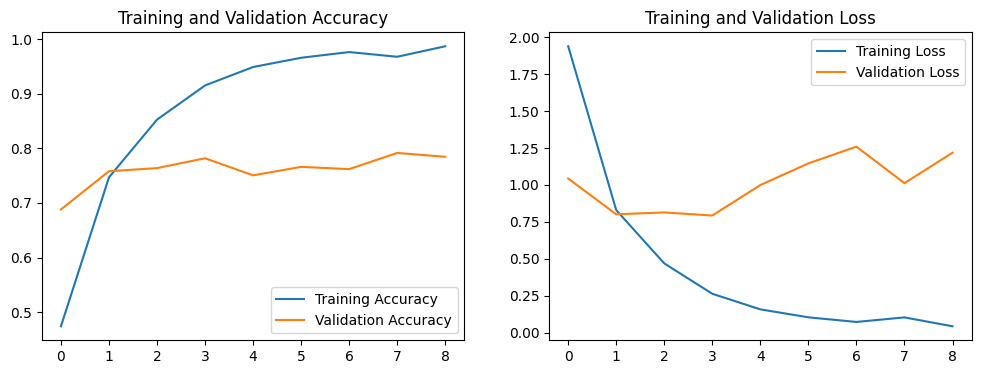

In [30]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(len(acc))

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Testing

In [28]:
X = np.array(all_test_images)
y = np.array(all_test_labels)

yhat = model.predict(X)

print(X.shape)
print(y.shape)
print(yhat.shape)

69/69 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step
(2208, 256, 256, 3)
(2208,)
(2208, 38)


In [29]:
from sklearn.metrics import precision_score, recall_score, accuracy_score

y_pred = np.argmax(yhat, axis=1)
y_pred = np.array(y_pred)

# Calculate the metrics using sklearn
precision = precision_score(y, y_pred, average='weighted')
recall = recall_score(y, y_pred, average='weighted')
accuracy = accuracy_score(y, y_pred)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"Accuracy: {accuracy}")

Precision: 0.8020645884068277
Recall: 0.779891304347826
Accuracy: 0.779891304347826
